In [2]:
import numpy as np
import matplotlib as matlib
import matplotlib.pyplot as plt
from matplotlib import cm
from scipy.stats import multivariate_normal
from scipy.sparse import spdiags
from scipy.sparse import kron
from mpl_toolkits.mplot3d import Axes3D
import time
import random
from sklearn.decomposition import PCA, NMF
import scipy.sparse as sp
import scipy.linalg as linalg
from numpy.random import default_rng
import matplotlib.patches as mpatches
import ot
import Gradient;

In [3]:
#define the the mixture of gaussian function 

#it generates and returns random parameters:
#[k-1 weight paras, k means]
def generate_random_para(k):
    mu_x = 0; mu_y = 0;
    if (k<=90):
        mu_x = np.array(random.sample(range(5, 95), k))/10;
        mu_y = np.array(random.sample(range(5, 95), k))/10;
    else:
        mu_x = np.array(random.sample(range(50, 950), k))/100;
        mu_y = np.array(random.sample(range(50, 950), k))/100;
    means = [];
    for i in range(k):
        means.append(np.array([mu_x[i], mu_y[i]]));
    means = np.array(means);
    weights = [random.randrange(40, 60) for i in range(k)];
    weights = np.array(weights);
    weights = weights/np.sum(weights);
    weights = weights[0:k-1];
    return [means, weights]; 

##X must have center at [2.25, 2.25]
N = 71; S = 10;
dx = S/N; dy = S/N;
X = [];
for i in range(1, N):
    for j in range(1, N):
        X.append([2-S/2 + dx*i, 2-S/2 + dy*j]);
X = np.array(X);
k = 2;
w_true = np.array([0.3]);
mu_true = np.array([[1, 3], [3, 2]]);
ytruth = Gradient.model(X, k, mu_true, w_true);
initial = np.array([0.8, 4, 4, 4, 3]);

In [4]:
##constant grid
##this is the grid that is used to plot the loss function 
grid = 0.1;

##it plots the loss function with fixed w, mu2
##it also plots the convergence history of mu1 given the trace and tracevalue paras
def plot_loss_mu1(X, w, mu2, grid, xrange, yrange, ytruth, den):
    x = np.arange(xrange[0],xrange[1],grid);
    y = np.arange(yrange[0],yrange[1],grid);
    P,Q = np.meshgrid(x,y)
    Z = np.zeros((x.size, y.size));
    for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = Gradient.loss(X, 2, np.array([np.array([grid*i+xrange[0], grid*j+yrange[0]]), mu2]), np.array([w]), ytruth);
    fig = plt.figure(figsize=(12, 8));
    axes = fig.gca(projection ='3d');
    axes.view_init(elev=50, azim=10);
    axes.plot_surface(P, Q, Z, alpha = 0.8);
    plt.show();
    fig, ax = plt.subplots(figsize=(7, 7));
    level = np.arange(Z.min(), Z.max(), (Z.max()-Z.min())/den);
    CS = ax.contour(Q,P,Z,levels = level);
    ax.clabel(CS, inline=True, fontsize=10);
    ax.set_title('Loss Function w.r.t mu1')
    
def plot_loss_mu2(X, w, mu1, grid, xrange, yrange, ytruth, den):
    x = np.arange(xrange[0],xrange[1],grid);
    y = np.arange(yrange[0],yrange[1],grid);
    P,Q = np.meshgrid(x,y)
    Z = np.zeros((x.size, y.size));
    for i in range(x.size):
        for j in range(y.size):
            Z[i, j] = Gradient.loss(X, 2, np.array([mu1, np.array([grid*i+xrange[0], grid*j+yrange[0]])]), 
                          np.array([w]), ytruth);
    fig = plt.figure(figsize=(12, 8));
    axes = fig.gca(projection ='3d');
    axes.view_init(elev=50, azim=10);
    axes.plot_surface(P, Q, Z, alpha = 0.8);
    plt.show();
    fig, ax = plt.subplots(figsize=(7, 7));
    level = np.arange(Z.min(), Z.max(), (Z.max()-Z.min())/den);
    CS = ax.contour(Q,P,Z,levels = level);
    ax.clabel(CS, inline=True, fontsize=10);
    ax.set_title('Loss Function w.r.t mu2, mu1=[{}, {}], w={}'.format(mu1[0], mu1[1], w))

### If we set w and $\mu_2$ to the truth value, and only allow $\mu_1$ to vary. The resulting loss function will be convex, with only one global minimum and no local maximum. It is the same when we only allow $\mu_1$ to vary.

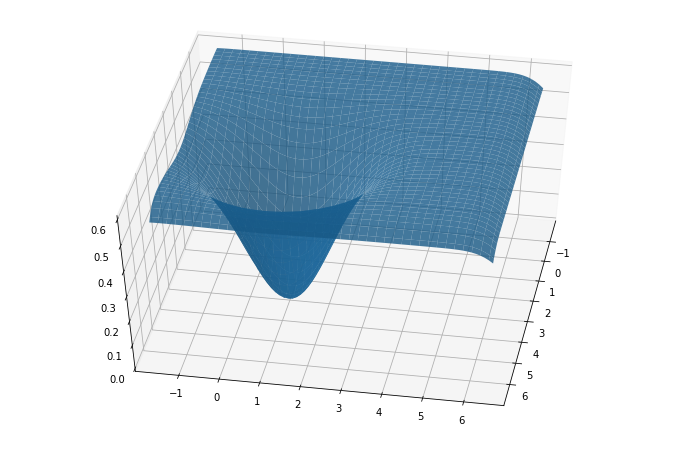

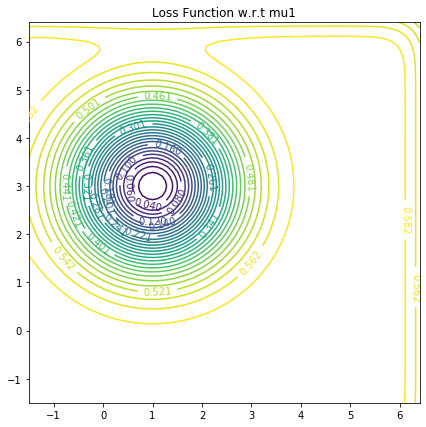

In [5]:
prange = np.array([[-1.5, 6.5], [-1.5, 6.5]]);
plot_loss_mu1(X, .3, mu_true[1], grid, prange[0], prange[1], ytruth, 30)

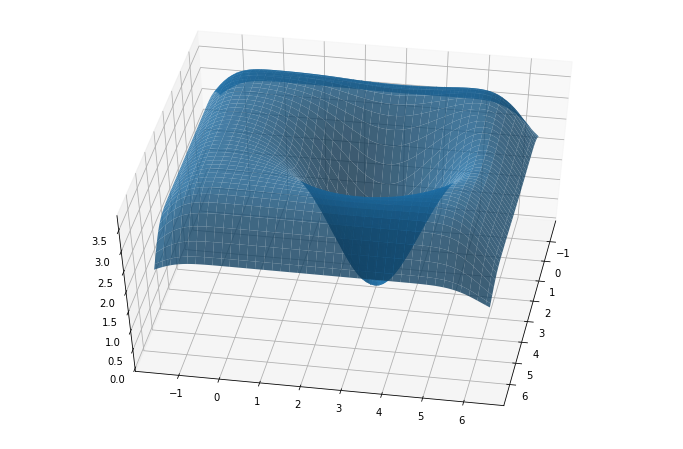

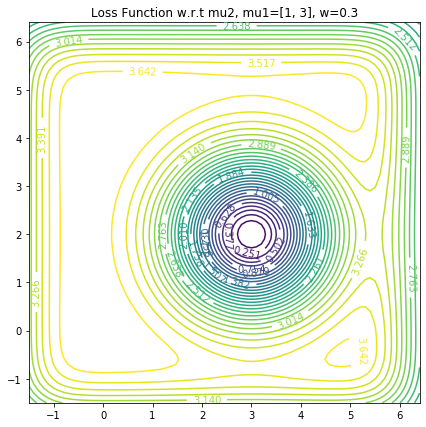

In [6]:
plot_loss_mu2(X, .3, mu_true[0], grid, prange[0], prange[1], ytruth, 30)

### Not setting the other parameters to the truth value will result in non-convex loss function.

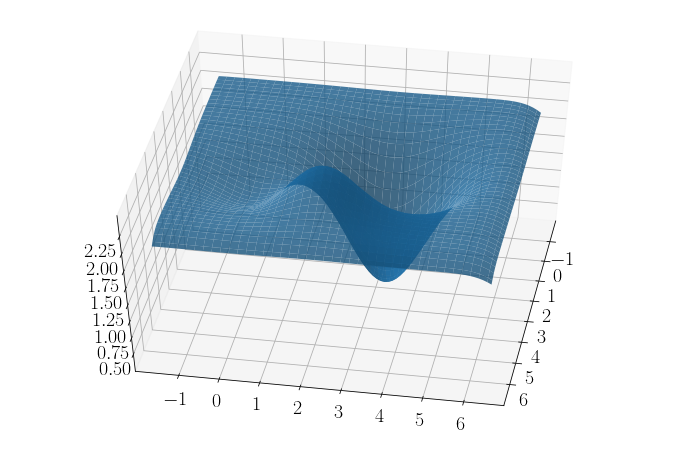

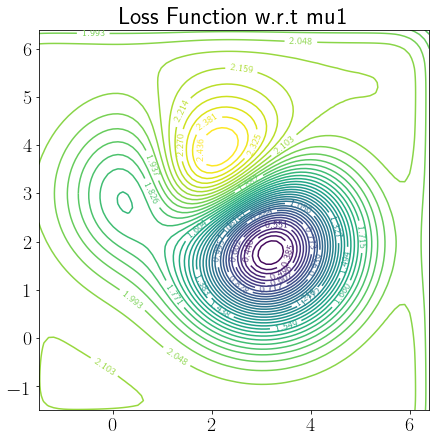

In [37]:
plot_loss_mu1(X, .5, np.array([2, 3]), grid, prange[0], prange[1], ytruth, 40)

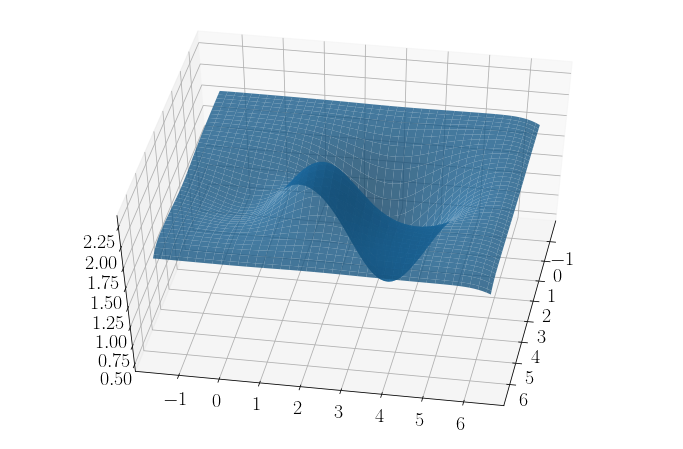

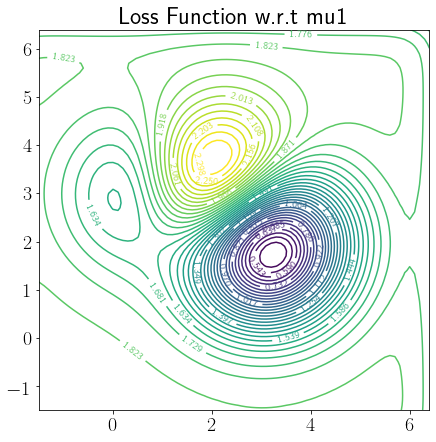

In [50]:
plot_loss_mu1(X, .4, np.array([2, 3]), grid, prange[0], prange[1], ytruth, 40)

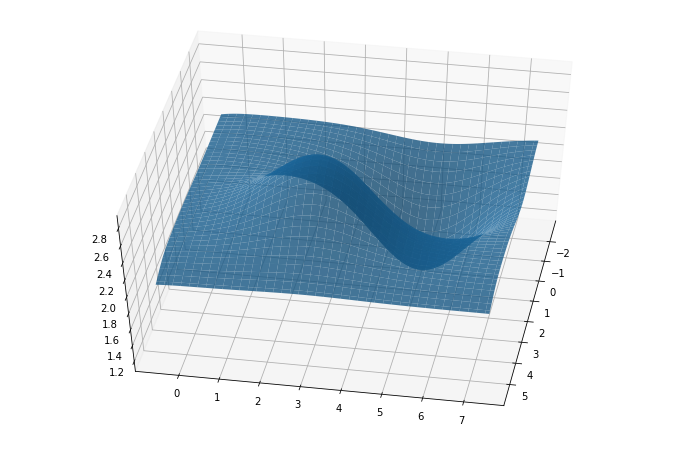

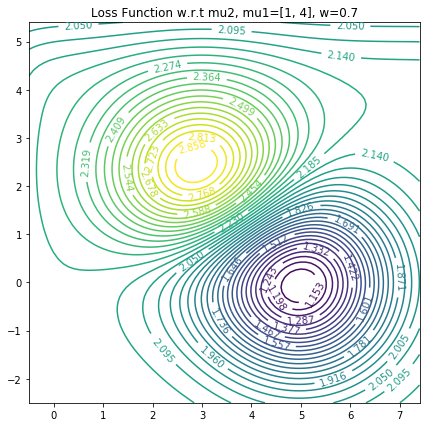

In [9]:
plot_loss_mu2(X, .7, np.array([1, 4]), grid, prange[0]-1, prange[1]+1, ytruth, 40)

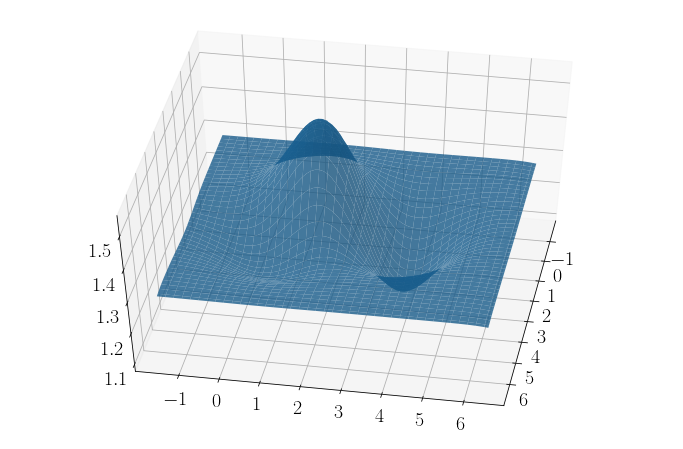

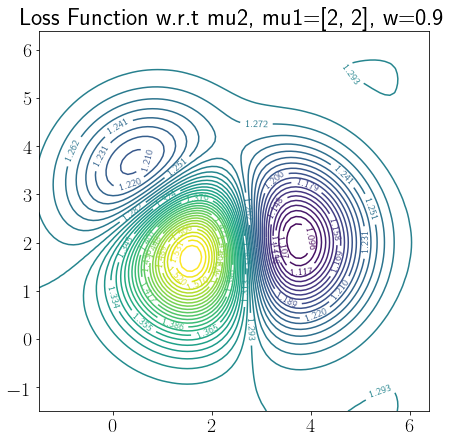

In [38]:
plot_loss_mu2(X, .9, np.array([2, 2]), grid, prange[0], prange[1], ytruth, 45);

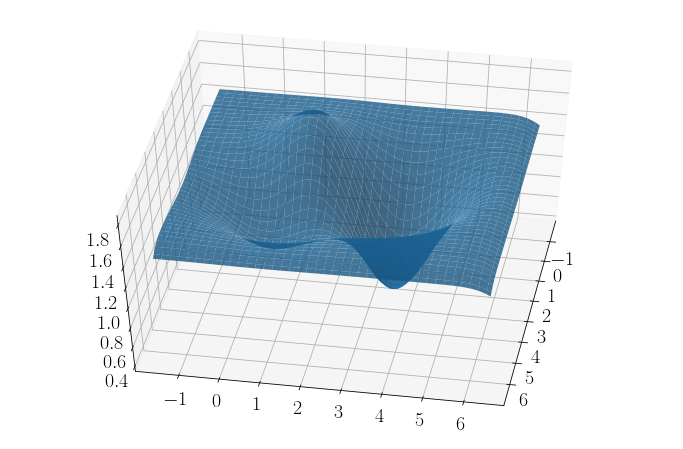

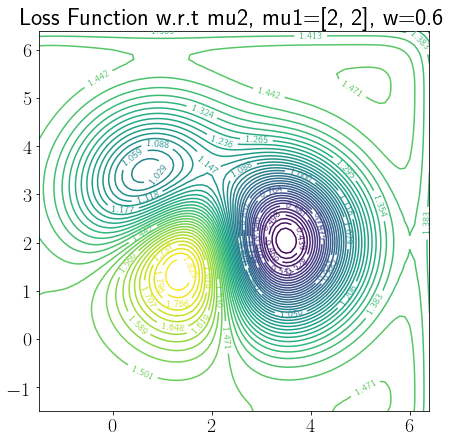

In [59]:
plot_loss_mu2(X, .6, np.array([2, 2]), grid, prange[0], prange[1], ytruth, 50);

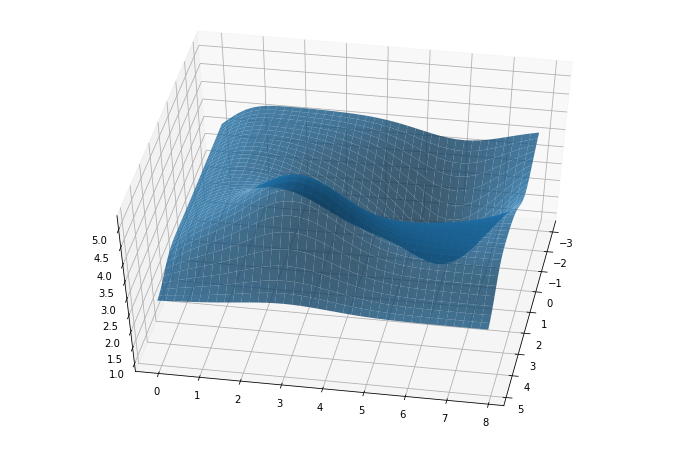

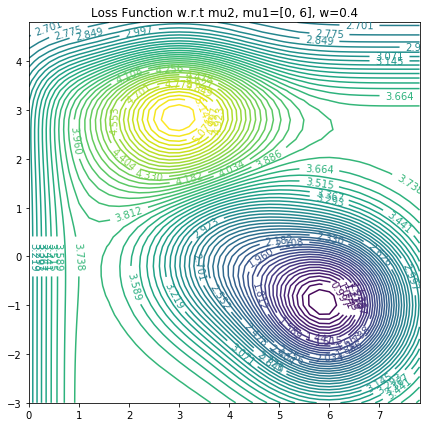

In [18]:
plot_loss_mu2(X, .4, np.array([0, 6]), grid, prange[0]-1.5, prange[1]+1.5, ytruth, 60);

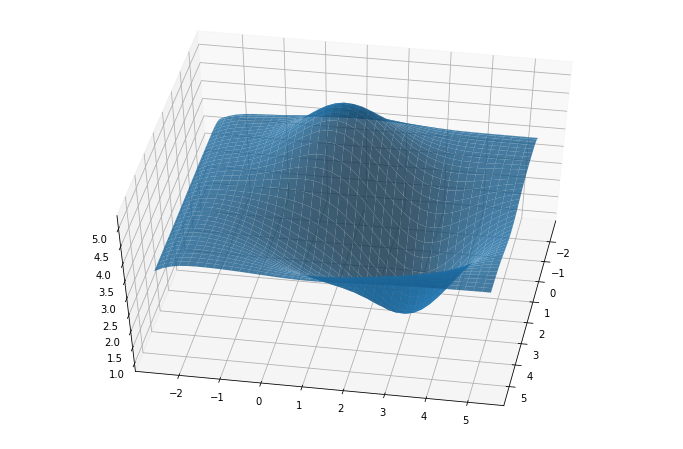

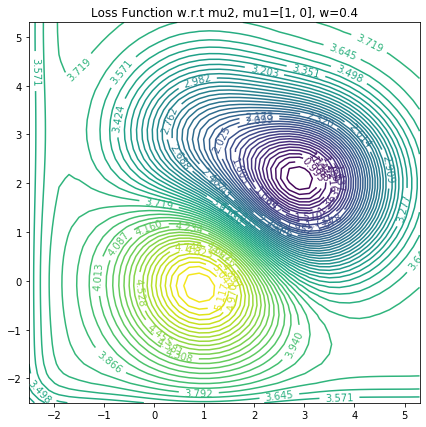

In [19]:
plot_loss_mu2(X, .4, np.array([1, 0]), grid, prange[0]-1, prange[1]-1, ytruth, 60);

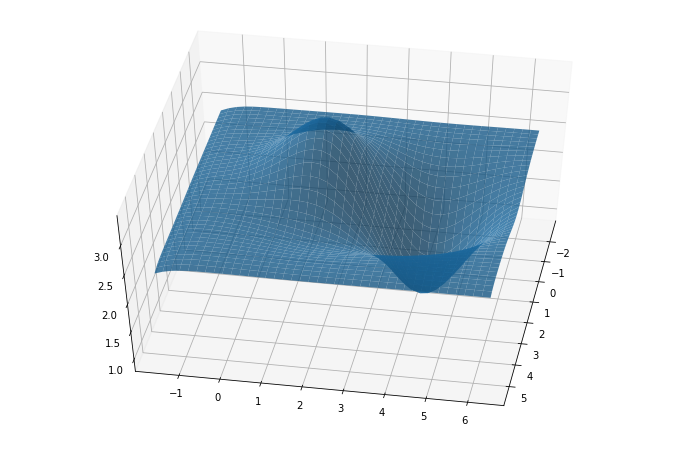

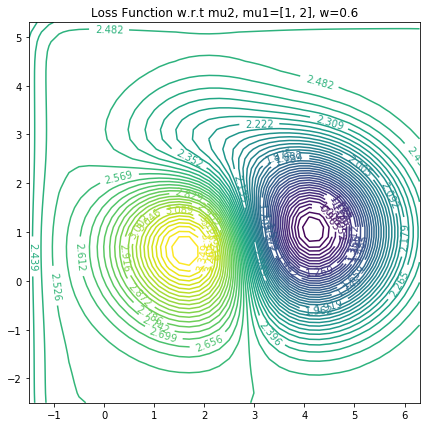

In [20]:
plot_loss_mu2(X, .6, np.array([1, 2]), grid, prange[0]-1, prange[1], ytruth, 60);

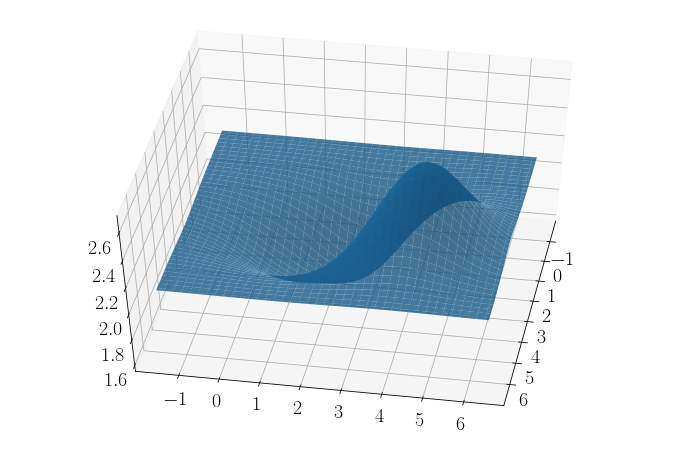

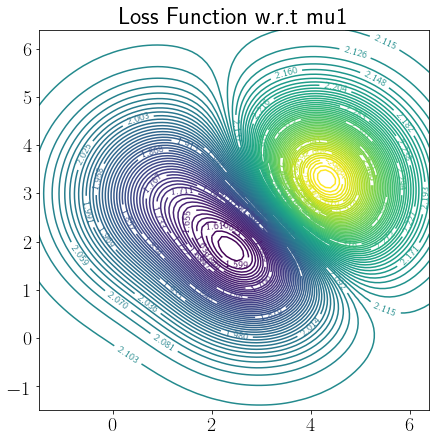

In [56]:
plot_loss_mu1(X, .2, np.array([4, 3]), grid, prange[0], prange[1], ytruth, 100)

-2.0
-1.5
-1.0
-0.5
0.0
0.5
1.0
1.5
2.0
2.5
3.0
3.5
4.0
4.5
5.0
5.5


No handles with labels found to put in legend.


6.0


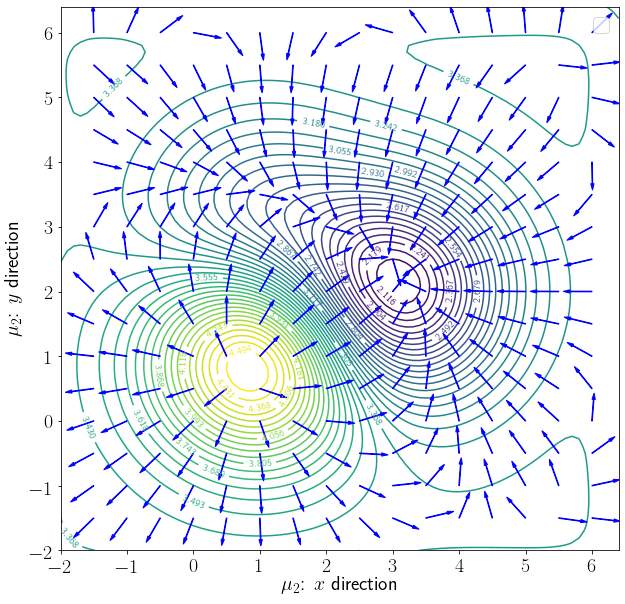

In [13]:
Gradient.Vector_field_stdmu2(X, np.array([1,1]), .7, ytruth, 
                             xrange = [-2, 6.5], yrange = [-2, 6.5])

No handles with labels found to put in legend.


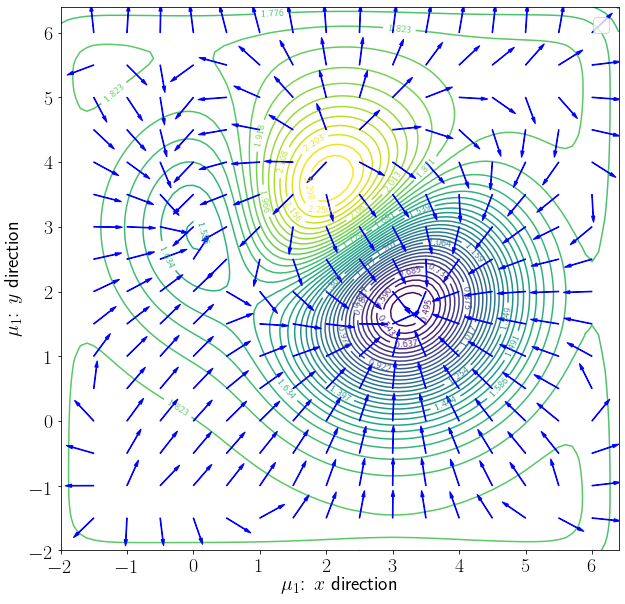

In [53]:
Gradient.Vector_field_l2mu1(X, np.array([2, 3]), .4, ytruth, N,
                             xrange = [-2, 6.5], yrange = [-2, 6.5])

-2.0
-1.5
-1.0
-0.5
0.0
0.5
1.0
1.5
2.0
2.5
3.0
3.5
4.0
4.5
5.0
5.5
6.0


No handles with labels found to put in legend.


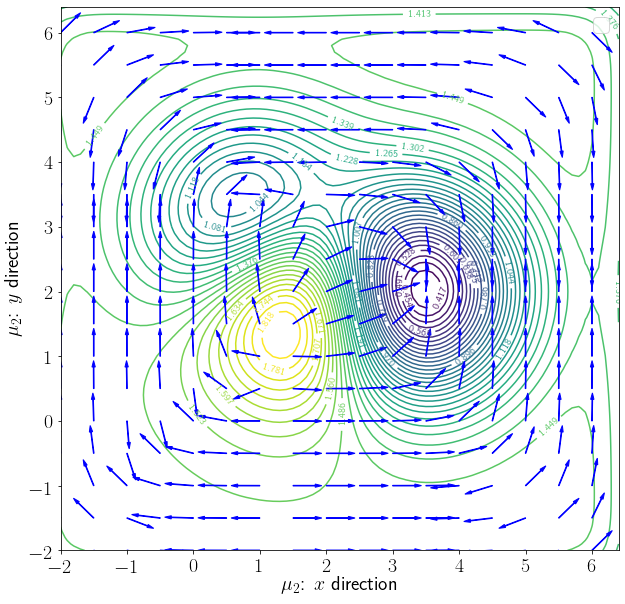

In [6]:
figpath = '/Users/leiwanzhou/Desktop/vectorfields/w2mu2-N71-S10-C22-d6-22-covd6VF.png';
ap = '/Users/leiwanzhou/Desktop/vectorfields/vectorlog/w2mu2-N71-S10-C22-d6-22-covd6VF.csv';
Gradient.Vector_field_w2mu2(X, np.array([2, 2]), .6, ytruth, N, dx, dy, 
        savpath=figpath, arrowpath = ap, xrange = [-2, 6.5], yrange = [-2, 6.5]);

-2.0
-1.5
-1.0
-0.5
0.0
0.5
1.0
1.5
2.0
2.5
3.0
3.5
4.0
4.5
5.0
5.5
6.0
6.5
7.0
7.5
8.0


No handles with labels found to put in legend.


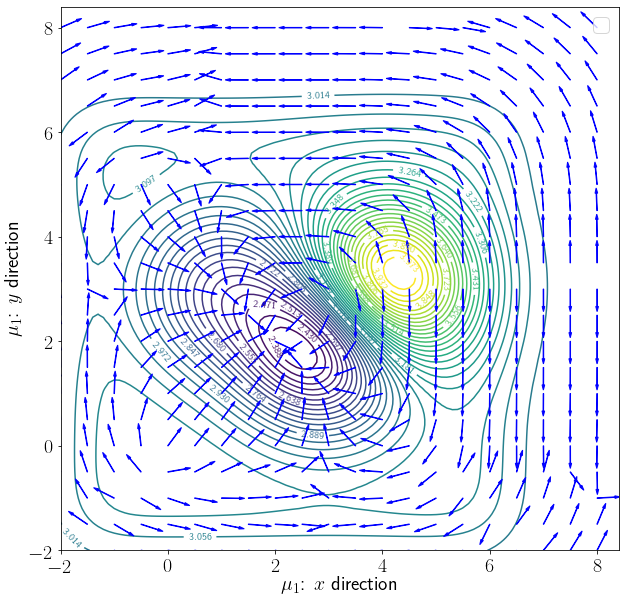

In [15]:
figpath = '/Users/leiwanzhou/Desktop/vectorfields/w2mu1_N61_8_d2_43_covd6VF.png';
ap = '/Users/leiwanzhou/Desktop/vectorfields/vectorlog/w2mu1_N61_8_d2_43_covd6VL.csv';
Gradient.Vector_field_w2mu1(X, np.array([4, 3]), .2, ytruth, N, dx, dy, 
        savpath=figpath, arrowpath = ap, xrange = [-2, 8.5], yrange = [-2, 8.5]);

-2.0
-1.5
-1.0
-0.5
0.0
0.5
1.0
1.5
2.0
2.5
3.0
3.5
4.0
4.5
5.0
5.5
6.0
6.5


No handles with labels found to put in legend.


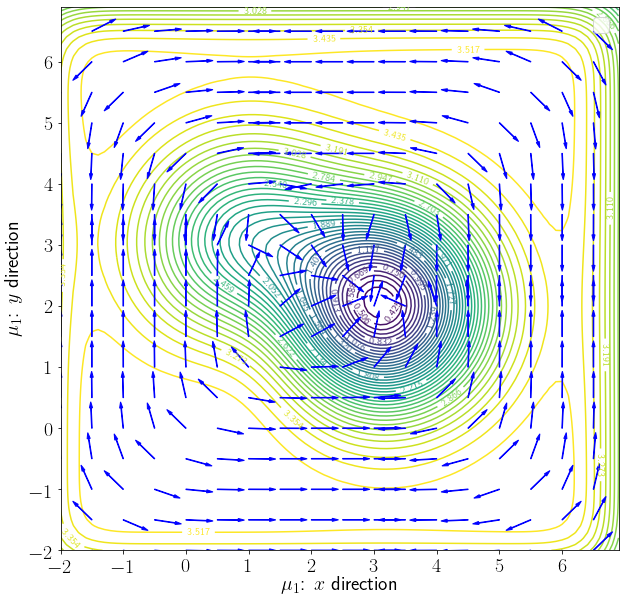

In [12]:
##X must have center at [2, 2]
N = 71; S = 10;
dx = S/N; dy = S/N;
X = [];
for i in range(1, N):
    for j in range(1, N):
        X.append([2.25-S/2 + dx*i, 2.25-S/2 + dy*j]);
X = np.array(X);

k = 2;
ytruth = Gradient.model(X, k, mu_true, w_true);

figpath = '/Users/leiwanzhou/Desktop/vectorfields/w2mu1_N71_10_d8_22_cen2d25_covd6VF.png';
ap = '/Users/leiwanzhou/Desktop/vectorfields/vectorlog/w2mu1_N71_10_d8_22_cen2d25_covd6VL.csv';
Gradient.Vector_field_w2mu1(X, np.array([2, 2]), .8, ytruth, N, dx, dy, 
        savpath=figpath, arrowpath = ap, xrange = [-2, 7], yrange = [-2, 7]);



-2.0
-1.5
-1.0
-0.5
0.0
0.5
1.0
1.5
2.0
2.5
3.0
3.5
4.0
4.5
5.0
5.5
6.0


No handles with labels found to put in legend.


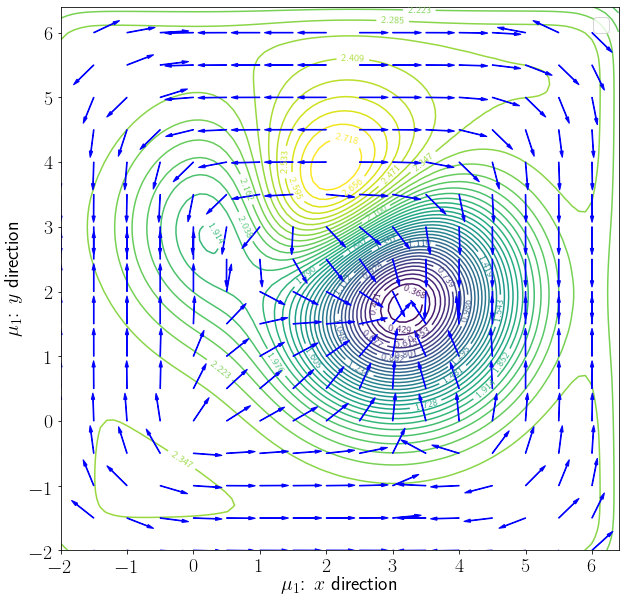

In [24]:
##X must have center at [2, 2]
N = 71; S = 10;
dx = S/N; dy = S/N;
X = [];
for i in range(1, N):
    for j in range(1, N):
        X.append([2-S/2 + dx*i, 2-S/2 + dy*j]);
X = np.array(X);

k = 2;
ytruth = Gradient.model(X, k, mu_true, w_true);

figpath = '/Users/leiwanzhou/Desktop/vectorfields/w2mu1_N75_10_d5_23_covd6VF.png';
ap = '/Users/leiwanzhou/Desktop/vectorfields/vectorlog/w2mu1_N75_10_d5_23_covd6VL.csv';
Gradient.Vector_field_w2mu1(X, np.array([2, 3]), .5, ytruth, N, dx, dy, 
        savpath=figpath, arrowpath = ap, xrange = [-2, 6.5], yrange = [-2, 6.5]);

No handles with labels found to put in legend.


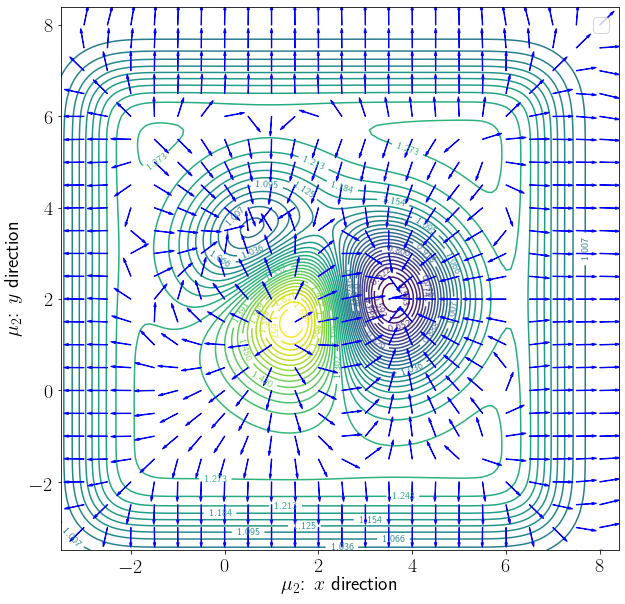

In [47]:
Gradient.Vector_field_l2mu2(X, np.array([2, 2]), .7, ytruth, N);

-3.5
-3.0
-2.5
-2.0
-1.5
-1.0
-0.5
0.0
0.5
1.0
1.5
2.0
2.5
3.0
3.5
4.0
4.5
5.0
5.5


No handles with labels found to put in legend.


6.0
6.5
7.0
7.5
8.0


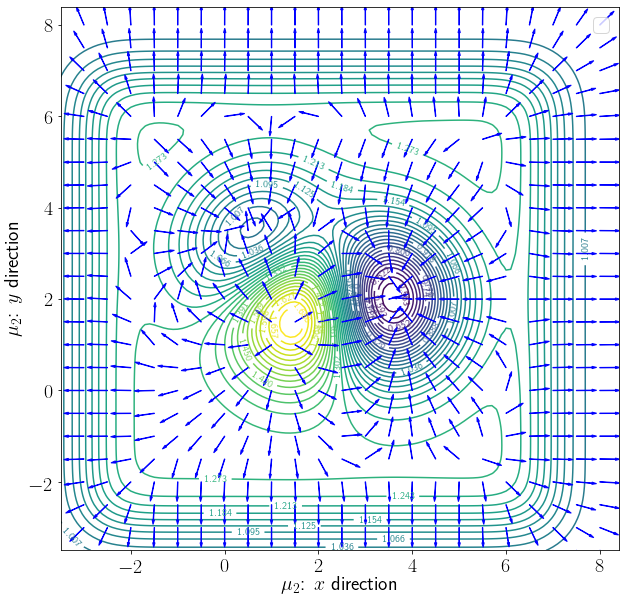

In [46]:
Gradient.Vector_field_stdmu2(X, np.array([2, 2]), .7, ytruth);

In [7]:
def cosine(v1, v2):
    return (v1.T @ v2)/(np.linalg.norm(v1)*np.linalg.norm(v2));

std_direct = -Gradient.gradient_mu2_all(X, .8, np.array([2, 2]), np.array([6, 6]), ytruth)[1]
l2_direct = Gradient.l2_Natural_dirFull_mu2(X, np.array([[2, 2], [6, 6]]), np.array([.8]), N, ytruth)

In [8]:
print(l2_direct)
cosine(std_direct, l2_direct)

[-0.01642838 -0.02257456]


1.0

In [9]:
J = Gradient.dpdmu2(.8, X, np.array([6, 6]))
q, r= linalg.qr(J, mode = 'economic');
drhoU = Gradient.dUdrho(X, 2, np.array([[2, 2], [6, 6]]), np.array([.8]), ytruth);
l2 = np.linalg.solve(r, -q.T @ drhoU);
print(l2);

[-0.01642838 -0.02257456]


In [10]:
def cosine(v1, v2):
    return (v1.T @ v2)/(np.linalg.norm(v1)*np.linalg.norm(v2));

std = Gradient.gradient_mu2_all(X, .8, np.array([2, 2]), np.array([6, 6]), ytruth)[1]
print(std);
print(cosine(std, l2))

[0.00017002 0.00023363]
-1.0


In [11]:
(np.linalg.inv(J.T @ J)@J.T).shape
l2= (np.linalg.inv(J.T @ J)@J.T)@(-drhoU)
print(l2)
print(J.T @ J)

[-0.01642838 -0.02257456]
[[1.03490502e-02 2.02450340e-19]
 [2.02450340e-19 1.03490502e-02]]


In [12]:
dpw = Gradient.dpdw(X, np.array([[2, 2], [6, 6]]), np.array([.8]), 2)
dpmu1 = Gradient.dpdmu1(.8, X, np.array([2, 2]));

In [13]:
J2 = np.concatenate((dpw, dpmu1, J), axis = 1)

In [14]:
J2.T @ J2

array([[ 1.03455785e+00, -2.77737565e-04, -2.77737565e-04,
        -6.94343914e-05, -6.94343914e-05],
       [-2.77737565e-04,  1.65584803e-01, -2.53246599e-19,
        -9.72081479e-05, -1.11095026e-04],
       [-2.77737565e-04, -2.53246599e-19,  1.65584803e-01,
        -1.11095026e-04, -9.72081479e-05],
       [-6.94343914e-05, -9.72081479e-05, -1.11095026e-04,
         1.03490502e-02,  2.02450340e-19],
       [-6.94343914e-05, -1.11095026e-04, -9.72081479e-05,
         2.02450340e-19,  1.03490502e-02]])

In [15]:
(J.T @ J)

array([[1.03490502e-02, 2.02450340e-19],
       [2.02450340e-19, 1.03490502e-02]])

In [16]:
dpmu1.T @ dpmu1

array([[ 1.65584803e-01, -2.53246599e-19],
       [-2.53246599e-19,  1.65584803e-01]])

### Let's check the information matrix of $G_{W_2}$ where contain all 5 paras

In [19]:
Y, Gw2_info = Gradient.Gw2_matrix(X, N, k, np.array([.3]), np.array([[1, 3], [4, 4]]), ytruth, dx, dy)

In [20]:
Gw2_info

array([[ 1.00569716e+02, -8.38731349e+00, -2.80830651e+00,
        -1.10369581e+01, -3.69768357e+00],
       [-8.38731349e+00,  1.69930087e+00,  7.12169504e-02,
         2.46591720e-01, -7.09986353e-02],
       [-2.80830651e+00,  7.12169504e-02,  1.49248403e+00,
        -6.88063830e-02,  4.59025952e-01],
       [-1.10369581e+01,  2.46591720e-01, -6.88063830e-02,
         4.31581319e+00,  6.85101902e-02],
       [-3.69768357e+00, -7.09986353e-02,  4.59025952e-01,
         6.85101902e-02,  4.09962271e+00]])

(111, 2)
(111,)


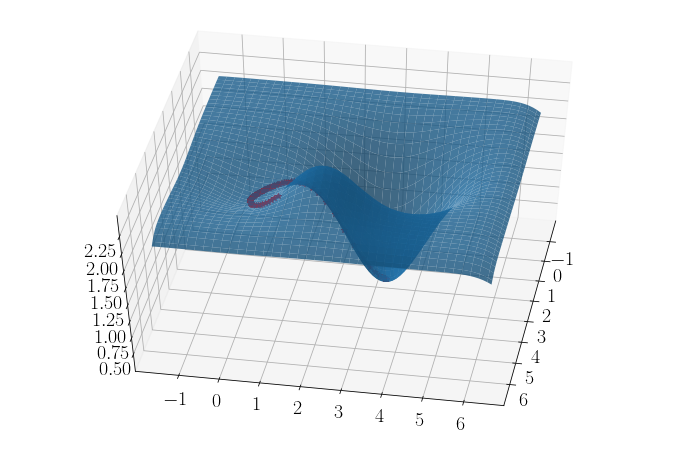

Initial parameter values:
mu1:[1,4] 
Optimized parameter values:
mu1:[3.21, 1.71] 
Time for 110 steps is 0.186784029006958 seconds.
The average time for each step is 0.001698036627335982 seconds.


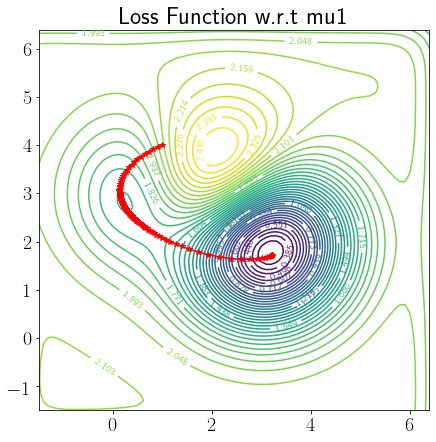

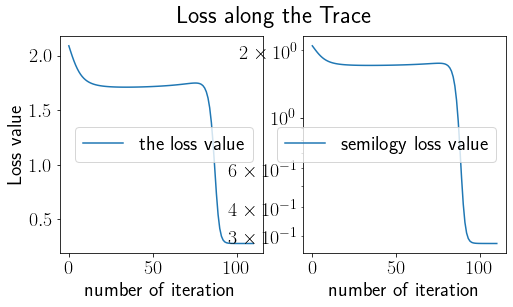

In [57]:
##initial d3 3d3132
#std GD
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/traces/std-mu1-N71-S10-c2-cov6-fd423-i14-lrd3-50.png"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/traces/std-mu1-N71-S10-c2-cov6-fd423-i14-lrd3-50trace"
stdGD_mu1_d24c3lrd1ini53d5,_ = Gradient.std_GD_mu1(X, 0.5, np.array([2, 3]), .4, np.array([1, 4]), 110, prange, ytruth, savepath1, savepath2);


-2.0
-1.5
-1.0
-0.5
0.0
0.5
1.0
1.5
2.0
2.5
3.0
3.5
4.0
4.5
5.0
5.5
6.0


/Users/leiwanzhou/Desktop/Optimal_Transport/Gradient_Flow/Wasserstein_Natural_GD/Gradient.py:733: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if (trace != ''):
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


6.5
7.0


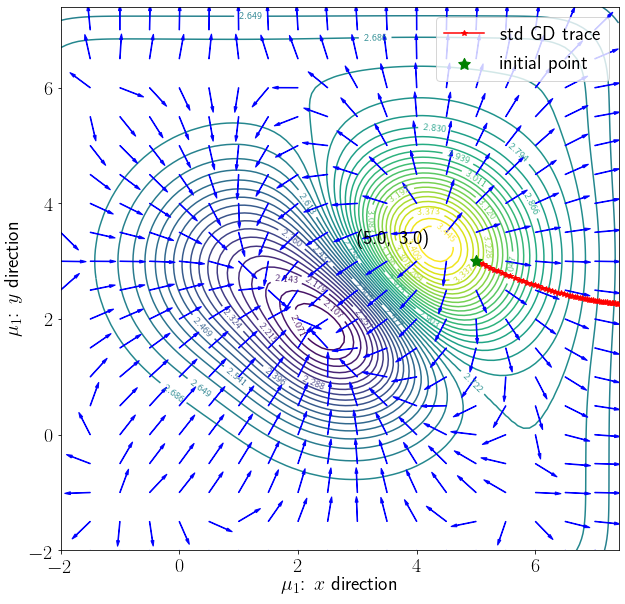

In [31]:
sav = "/Users/leiwanzhou/Desktop/vectorfields/stdmu1-N71-S10-C2d25-fd2-43-lrd3-iter50-cov6VF.eps"
Gradient.Vector_field_stdmu1(X, np.array([4, 3]), .2, ytruth, 
                            trace = stdGD_mu1_d24c3lrd1ini53d5, savpath = sav, 
                            xrange = [-2, 7.5], yrange = [-2, 7.5])

In [16]:
natGD_mu1_d243_53[-1]

array([2.0638552 , 1.94745643])

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
(201, 2)
(201,)


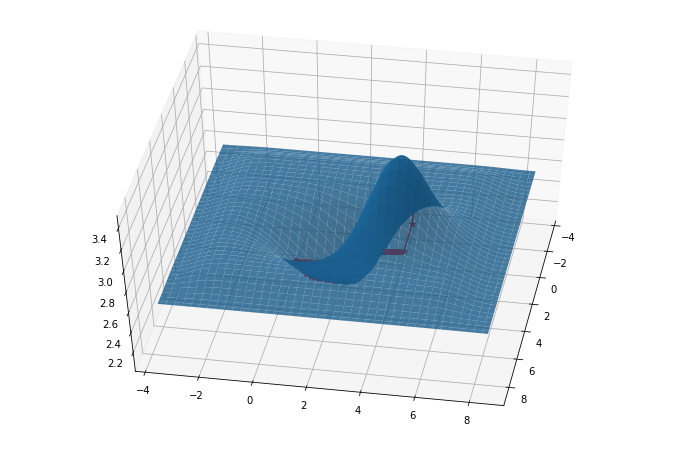

Initial parameter values:
mu1:[5.0,3.5] 
Optimized parameter values:
mu1:[2.06, 1.95] 
Time for 200 steps is 2572.51424407959 seconds.
The average time for each step is 12.86257122039795 seconds.


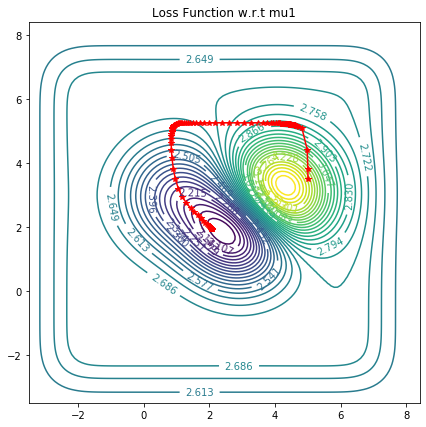

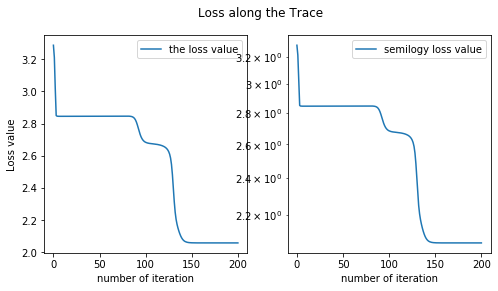

In [24]:
A = Gradient.discretize(N, dx, dy);
prange = np.array([[-3.5, 8.5], [-3.5, 8.5]]);
savepath1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/traces/nat-mu1-d2-43-lr20-200-ini53d5-N75S10Covd6-cen2d25trace"
savepath2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/traces/nat-mu1-d2-43-lr20-200-ini53d5-N75S10Covd6-cen2d25contour"
natGD_mu1_d243_53,_ = Gradient.Natural_GD_mu1(X, N, A, 0.2, np.array([4, 3]), 20, np.array([5, 3.5]), 200, prange, 
                                              ytruth, savepath1, savepath2);


In [25]:
np.savetxt('/Users/leiwanzhou/Desktop/l2_mix_4para/traces/nat-mu1-d2-43-lr20-200-ini53d5-N75S10Covd6-cen2d25trace.csv', 
         natGD_mu1_d243_53);

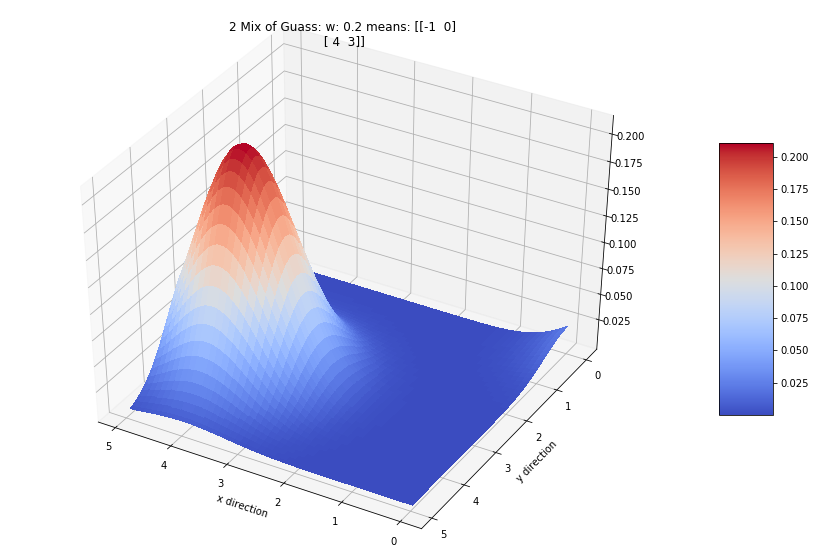

In [6]:
sav = '/Users/leiwanzhou/Desktop/vectorfields/models/model-wd3-1332-ang40-120.eps'
Gradient.plot_data(np.array([[-1, 0], [4, 3]]), np.array([.2]), np.array([0, 5]), 
                  np.array([0, 5]), .05, 40, 120);

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


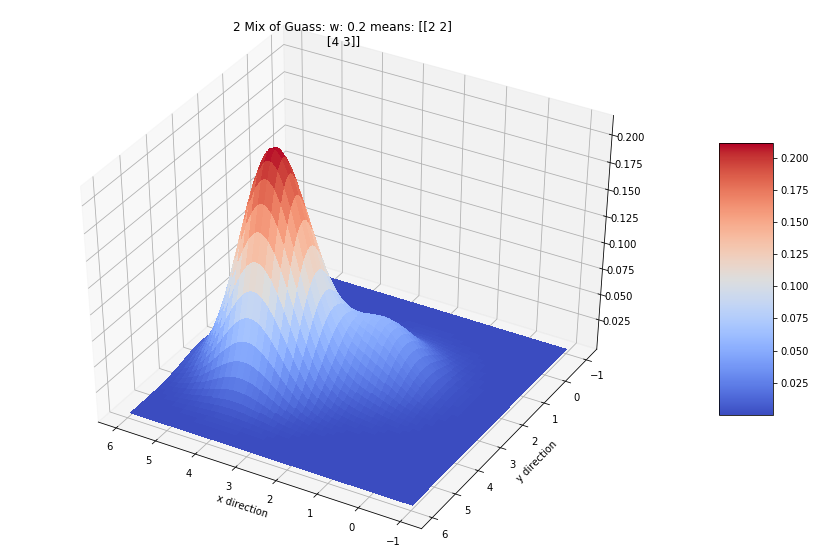

In [22]:
sav = '/Users/leiwanzhou/Desktop/vectorfields/models/model-wd2-2243-ang40-120.eps'
Gradient.plot_data(np.array([[2, 2], [4, 3]]), np.array([.2]), np.array([-1, 6]), 
                  np.array([0, 5]), .05, 40, 120, savepath=sav);

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


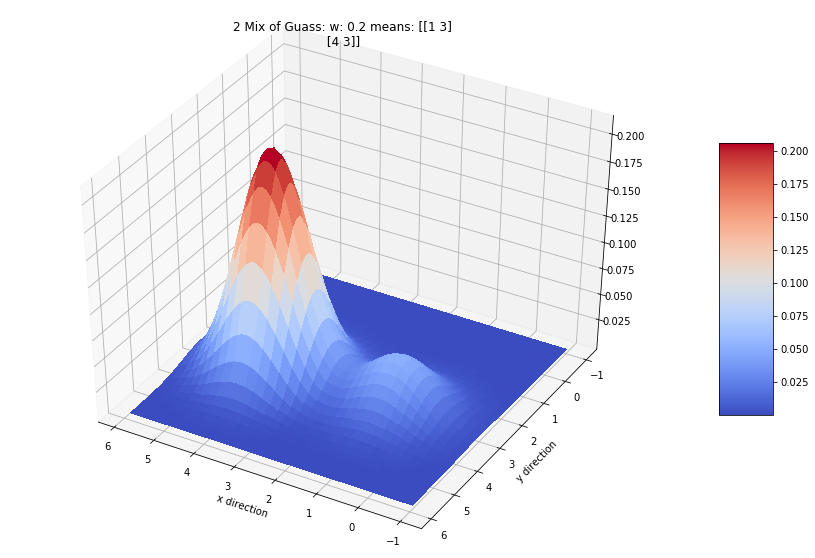

In [23]:
sav = '/Users/leiwanzhou/Desktop/vectorfields/models/model-wd2-1343-ang40-120.eps'
Gradient.plot_data(np.array([[1, 3], [4, 3]]), np.array([.2]), np.array([-1, 6]), 
                  np.array([-1, 6]), .1, 40, 120, savepath=sav);

### Try another setting

In [59]:
##X must have center at [2, 2]
N = 75; S = 15;
dx = S/N; dy = S/N;
X = [];
for i in range(1, N):
    for j in range(1, N):
        X.append([2-S/2 + dx*i, 2-S/2 + dy*j]);
X = np.array(X);

# ##not centered
# N = 31;
# dx = 5/N; dy = 5/N;
# X = [];
# for i in range(1, N):
#     for j in range(1, N):
#         X.append([dx*i, dy*j]);
# X = np.array(X);

k = 2;
w_true = np.array([0.3]);
mu_true = np.array([[1, 3], [3, 2]]);
ytruth = Gradient.model(X, k, mu_true, w_true);
initial = np.array([0.8, 4, 4, 4, 3]);
A = Gradient.discretize(N, dx, dy)

-3.5
-3.0
-2.5
-2.0
-1.5
-1.0
-0.5
0.0
0.5
1.0
1.5
2.0
2.5
3.0
3.5
4.0
4.5
5.0
5.5


No handles with labels found to put in legend.


6.0
6.5
7.0
7.5
8.0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


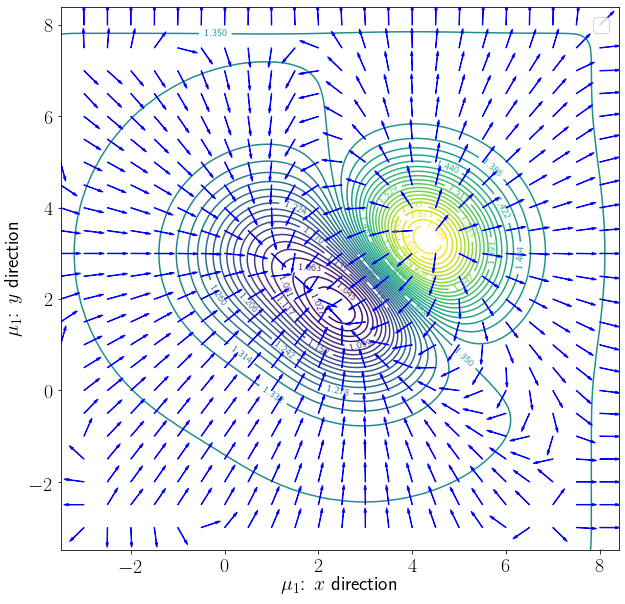

In [60]:
sav='/Users/leiwanzhou/Desktop/vectorfields/stdmu1-N75-S15centered-d2-43-cov1.eps';
Gradient.Vector_field_stdmu1(X, np.array([4, 3]), .2, ytruth, savpath=sav);

No handles with labels found to put in legend.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


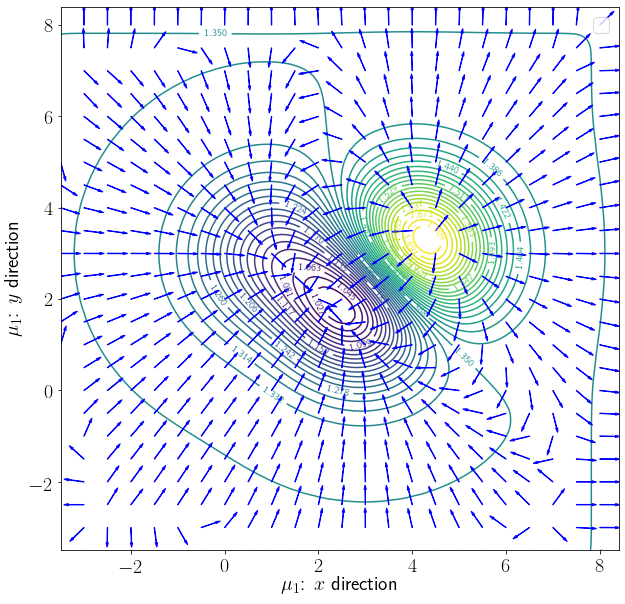

In [61]:
sav='/Users/leiwanzhou/Desktop/vectorfields/l2mu1-N75-S15centered-d2-43-cov1.eps';
Gradient.Vector_field_l2mu1(X, np.array([4, 3]), .2, ytruth, N, savpath=sav);

In [48]:
mu = np.array([[4, 3], [3, 2]]);
mu11 = Gradient.dpdmu11(X, mu[0], .2);
w = Gradient.dpdw(X, mu, .2, 2);
mu11 = mu11.reshape(-1, 1);

In [55]:
np.concatenate((w, mu11), axis=1)

array([[-2.66124590e-15,  1.86598511e-20],
       [-5.38918225e-15,  4.34657911e-20],
       [-1.07015951e-14,  9.92829861e-20],
       ...,
       [ 8.24298318e-07, -5.12896251e-07],
       [ 4.77507111e-07, -2.97101427e-07],
       [ 2.71244199e-07, -1.68759324e-07]])

In [5]:
Gradient.gradient_w_mu11(X, .2, np.array([[4, 3], [3, 2]]))

array([[-2.66124590e-15,  1.86598511e-20],
       [-5.38918225e-15,  4.34657911e-20],
       [-1.07015951e-14,  9.92829861e-20],
       ...,
       [ 8.24298318e-07, -5.12896251e-07],
       [ 4.77507111e-07, -2.97101427e-07],
       [ 2.71244199e-07, -1.68759324e-07]])

In [31]:
vf = np.genfromtxt(ap)
vf.shape

(361, 2)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


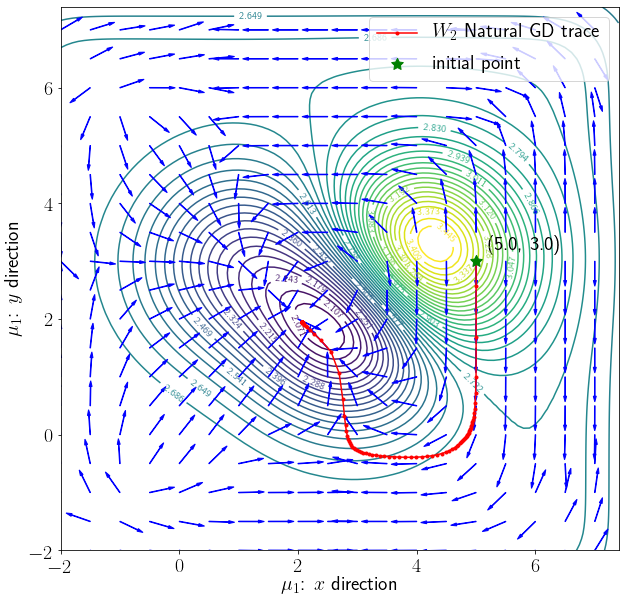

In [7]:
ap = '/Users/leiwanzhou/Desktop/vectorfields/vectorlog/w2mu1_N71_10_d2_43_cen2d25_covd6VL.csv';
tpath='/Users/leiwanzhou/Desktop/l2_mix_4para/traces/nat-mu1-d2-43-lr20-100-ini53-N71S10Covd6-cen2d25trace.csv';
sav = '/Users/leiwanzhou/Desktop/vectorfields/w2mu1_N71_10_d2_43_cen2d25_i53-covd6VL_together.eps';
Gradient.plot_VF_mu1(X, np.array([4, 3]), .2, ytruth, m=19, n=19, vfpath=ap, 
                    tracepath=tpath, savpath=sav);

(41, 2)
(41,)


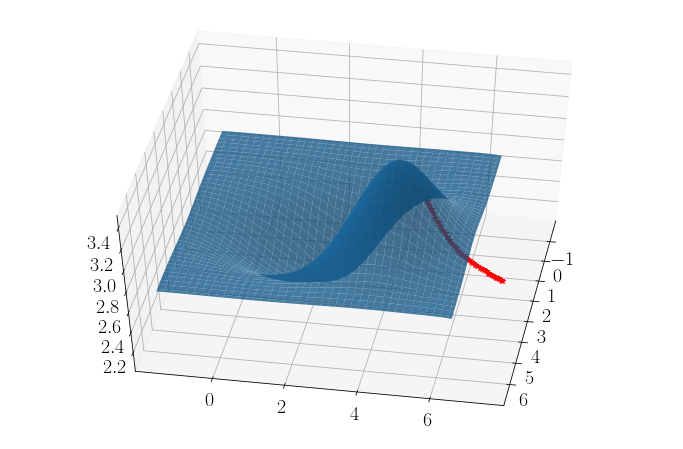

Initial parameter values:
mu1:[5.0,3.5] 
Optimized parameter values:
mu1:[7.38, 4.17] 
Time for 40 steps is 0.10245013236999512 seconds.
The average time for each step is 0.0025612533092498778 seconds.


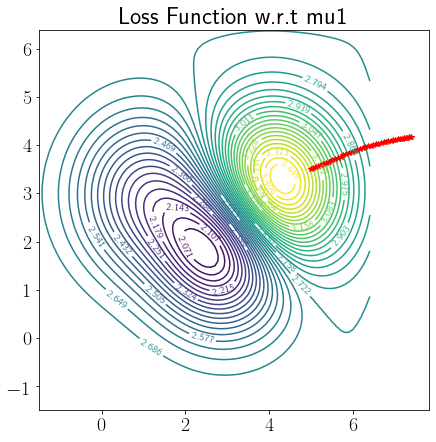

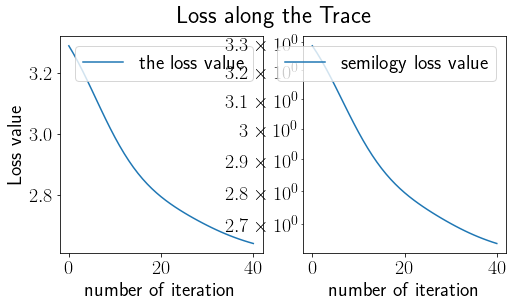

In [15]:
##initial d3 3d3132
#std GD
sav1 = "/Users/leiwanzhou/Desktop/l2_mix_4para/traces/l2mu1-N71-S10-c2d25-cov6-fd243-i53d5-lrd02-40.png"
sav2 = "/Users/leiwanzhou/Desktop/l2_mix_4para/traces/l2mu1-N71-S10-c2d25-cov6-fd243-i53d5-lrd02-40trace"
l2mu1trace,_ = Gradient.l2_Natural_GD_mu1(X, N, .2, np.array([4, 3]), .02, np.array([5, 3.5]), 40, 
                                prange, ytruth, savepath1=sav1, savepath2=sav2);


/Users/leiwanzhou/Desktop/Optimal_Transport/Gradient_Flow/Wasserstein_Natural_GD/Gradient.py:858: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if (trace != ''):
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


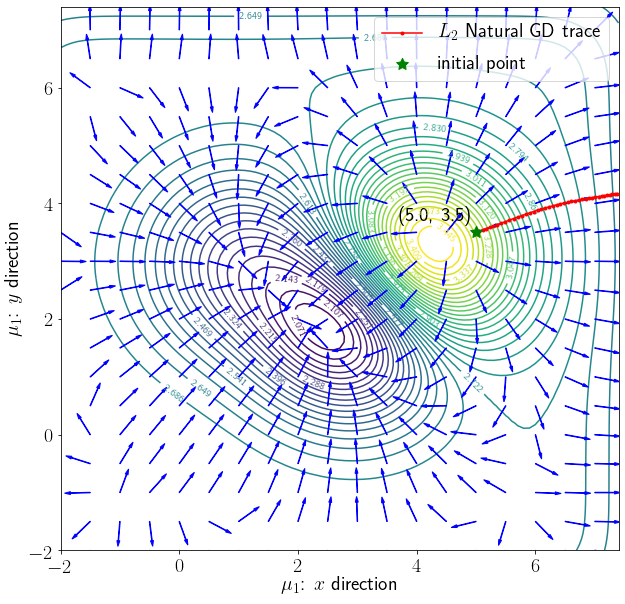

In [17]:
sav = '/Users/leiwanzhou/Desktop/vectorfields/l2mu1_N71_10_d2_43_cen2d25_i53d5-covd6VL_together.eps';
Gradient.Vector_field_l2mu1(X, np.array([4, 3]), .2, ytruth, N, trace=l2mu1trace,
                            savpath=sav, xrange = [-2, 7.5], yrange = [-2, 7.5])